In [90]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import dataprep
from dataprep.eda import plot,plot_correlation,plot_missing
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix,precision_score, f1_score
from sklearn.preprocessing import LabelEncoder, StandardScaler, OrdinalEncoder

import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=UserWarning, message="A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy")

In [3]:
data = pd.read_csv("income.csv")
data.head(5)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,40,Self-emp-not-inc,223881,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,99999,0,70,United-States,>50K
1,30,Private,149118,HS-grad,9,Divorced,Craft-repair,Not-in-family,White,Female,0,0,40,United-States,<=50K
2,46,Private,109209,Some-college,10,Married-civ-spouse,Adm-clerical,Husband,White,Male,0,0,40,United-States,>50K
3,32,Private,229566,Assoc-voc,11,Married-civ-spouse,Other-service,Husband,White,Male,0,0,60,United-States,>50K
4,54,?,148657,Preschool,1,Married-civ-spouse,?,Wife,White,Female,0,0,40,Mexico,<=50K


As we can see in some rows we have "?" which means it is missing value.We will replace it with np.NAN later.

Data shape

In [4]:
print(f"This data contain {data.shape[0]} rows and {data.shape[1]} columns")

This data contain 25000 rows and 15 columns


In [5]:
print("Number of duplicate data : ",data.duplicated().sum())

Number of duplicate data :  12


In [6]:
data = data.drop_duplicates()
data

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,40,Self-emp-not-inc,223881,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,99999,0,70,United-States,>50K
1,30,Private,149118,HS-grad,9,Divorced,Craft-repair,Not-in-family,White,Female,0,0,40,United-States,<=50K
2,46,Private,109209,Some-college,10,Married-civ-spouse,Adm-clerical,Husband,White,Male,0,0,40,United-States,>50K
3,32,Private,229566,Assoc-voc,11,Married-civ-spouse,Other-service,Husband,White,Male,0,0,60,United-States,>50K
4,54,?,148657,Preschool,1,Married-civ-spouse,?,Wife,White,Female,0,0,40,Mexico,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,40,Private,130834,Some-college,10,Never-married,Adm-clerical,Not-in-family,White,Female,0,0,40,United-States,<=50K
24996,31,Local-gov,33124,Bachelors,13,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,50,United-States,<=50K
24997,38,Federal-gov,190895,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,?,>50K
24998,23,Private,420973,Bachelors,13,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,40,United-States,<=50K


Information of our target

In [7]:
data["income"].value_counts()

<=50K    18943
>50K      6045
Name: income, dtype: int64

In [8]:
data["income"].value_counts(normalize=True)

<=50K    0.758084
>50K     0.241916
Name: income, dtype: float64

Data information and description

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24988 entries, 0 to 24999
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             24988 non-null  int64 
 1   workclass       24988 non-null  object
 2   fnlwgt          24988 non-null  int64 
 3   education       24988 non-null  object
 4   education.num   24988 non-null  int64 
 5   marital.status  24988 non-null  object
 6   occupation      24988 non-null  object
 7   relationship    24988 non-null  object
 8   race            24988 non-null  object
 9   sex             24988 non-null  object
 10  capital.gain    24988 non-null  int64 
 11  capital.loss    24988 non-null  int64 
 12  hours.per.week  24988 non-null  int64 
 13  native.country  24988 non-null  object
 14  income          24988 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.1+ MB


In [10]:
data.describe()

,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
count,24988.000000,2.498800e+04,24988.000000,24988.000000,24988.000000,24988.000000
mean,38.612214,1.896777e+05,10.077277,1083.664199,87.531815,40.445214
std,13.682532,1.054772e+05,2.575997,7323.691060,402.922400,12.309125
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.179965e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.782185e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [12]:
data.describe(include=np.number)

,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
count,24988.000000,2.498800e+04,24988.000000,24988.000000,24988.000000,24988.000000
mean,38.612214,1.896777e+05,10.077277,1083.664199,87.531815,40.445214
std,13.682532,1.054772e+05,2.575997,7323.691060,402.922400,12.309125
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.179965e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.782185e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [14]:
data.describe(include="object")

,workclass,education,marital.status,occupation,relationship,race,sex,native.country,income
count,24988,24988,24988,24988,24988,24988,24988,24988,24988
unique,9,16,7,15,6,5,2,41,2
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,<=50K
freq,17459,8021,11516,3196,10144,21319,16710,22406,18943


Data nun unique values

In [15]:
data.nunique()

age                  73
workclass             9
fnlwgt            17876
education            16
education.num        16
marital.status        7
occupation           15
relationship          6
race                  5
sex                   2
capital.gain        117
capital.loss         90
hours.per.week       93
native.country       41
income                2
dtype: int64

education and education.num represent same so we drop education column

In [16]:
data = data.drop(columns=["education"])
data.head()

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,40,Self-emp-not-inc,223881,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,99999,0,70,United-States,>50K
1,30,Private,149118,9,Divorced,Craft-repair,Not-in-family,White,Female,0,0,40,United-States,<=50K
2,46,Private,109209,10,Married-civ-spouse,Adm-clerical,Husband,White,Male,0,0,40,United-States,>50K
3,32,Private,229566,11,Married-civ-spouse,Other-service,Husband,White,Male,0,0,60,United-States,>50K
4,54,?,148657,1,Married-civ-spouse,?,Wife,White,Female,0,0,40,Mexico,<=50K


Replace "?" with np.NAN to detect missing values easily

In [17]:
data = data.replace("?",np.NaN)

  0%|                                                                                          | 0/580 [00:00<…


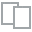
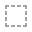
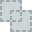
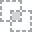
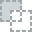
...
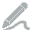
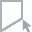
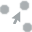
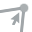
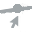

In [18]:
plot(data)


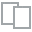
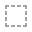
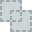
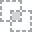
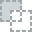
...
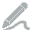
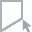
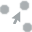
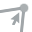
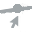

In [19]:
plot_correlation(data)

  0%|                                                                                          | 0/174 [00:00<…


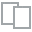
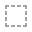
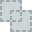
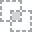
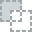
...
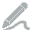
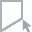
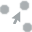
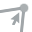
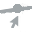

In [20]:
plot_missing(data)

In [22]:
missing_counts = data.isnull().sum()

fig = go.Figure(data=[go.Bar(x=missing_counts.index, y=missing_counts.values)])

fig.update_layout(title_text='Missing Value Counts',
                  xaxis_title='Columns',
                  yaxis_title='Missing Value Count')

fig.show()

Data visualization and data cleaning


      Pie plot for our target (income)

In [23]:
px.pie(data,names="income",title="Income",color_discrete_map=px.colors.qualitative.G10)

In [24]:
le = LabelEncoder()

columns_to_encode = ['workclass', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country','income']

for col in columns_to_encode:
    data[col] = le.fit_transform(data[col])

      Replace missing values with the most frequent value


In [25]:
cols = ["workclass","occupation","native.country"]

for col in cols:
    most_freq = data[col].value_counts().sort_values(ascending=False).index[0]
    data[col].fillna(most_freq,inplace=True)
    
    print("All the missing values in column", col, "are replaced with",most_freq)

All the missing values in column workclass are replaced with 3
All the missing values in column occupation are replaced with 9
All the missing values in column native.country are replaced with 37


      Box plot for numreical values and detecting outliers


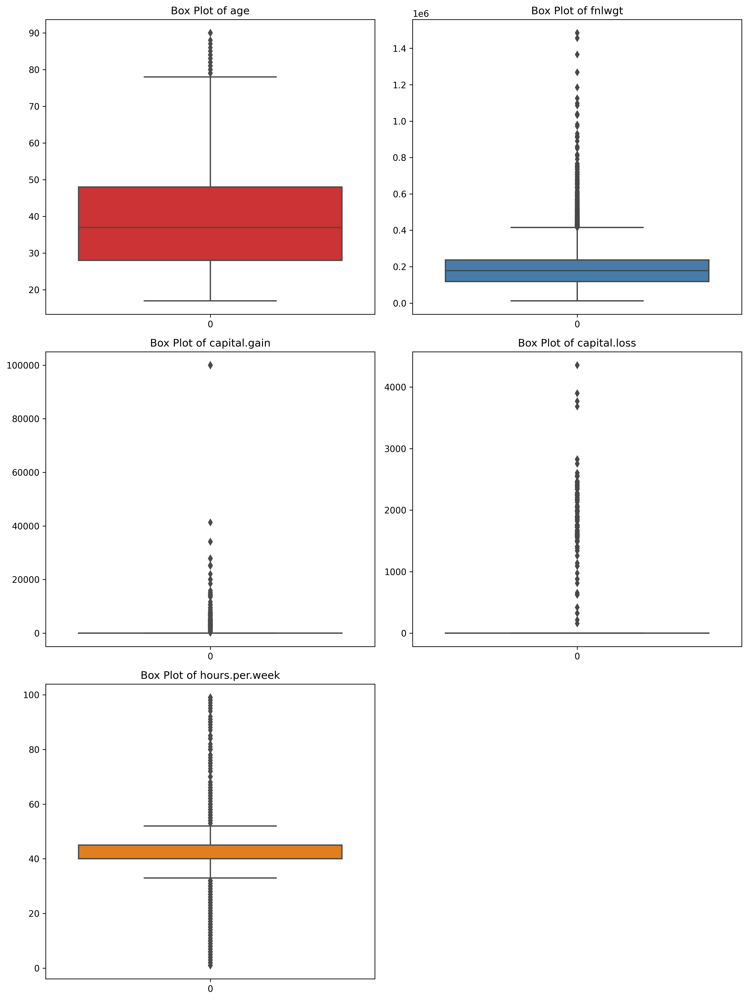

In [34]:
column_to_exclude = ['sex', 'workclass', 'education.num', 'marital.status', 'occupation', 'race', 'relationship', 'income', 'native.country']


all_columns = data.columns

columns = all_columns.drop(column_to_exclude).values

num_columns = len(columns)
num_rows = (num_columns + 1) // 2

fig, axes = plt.subplots(num_rows, 2, figsize=(12, 16),dpi = 300)

colors = sns.color_palette("Set1", num_columns)
for i, column in enumerate(columns):
    row = i // 2
    col = i % 2
    sns.boxplot(data=data[column], ax=axes[row, col], color=colors[i])
    axes[row, col].set_title(f'Box Plot of {column}')

if num_columns % 2 != 0:
    axes[-1, -1].axis('off')

plt.tight_layout()
plt.show()

In [35]:
data = data[(data["capital.gain"]<50000) & (data["capital.loss"] < 3000)]

      Histogram plot for numerical values


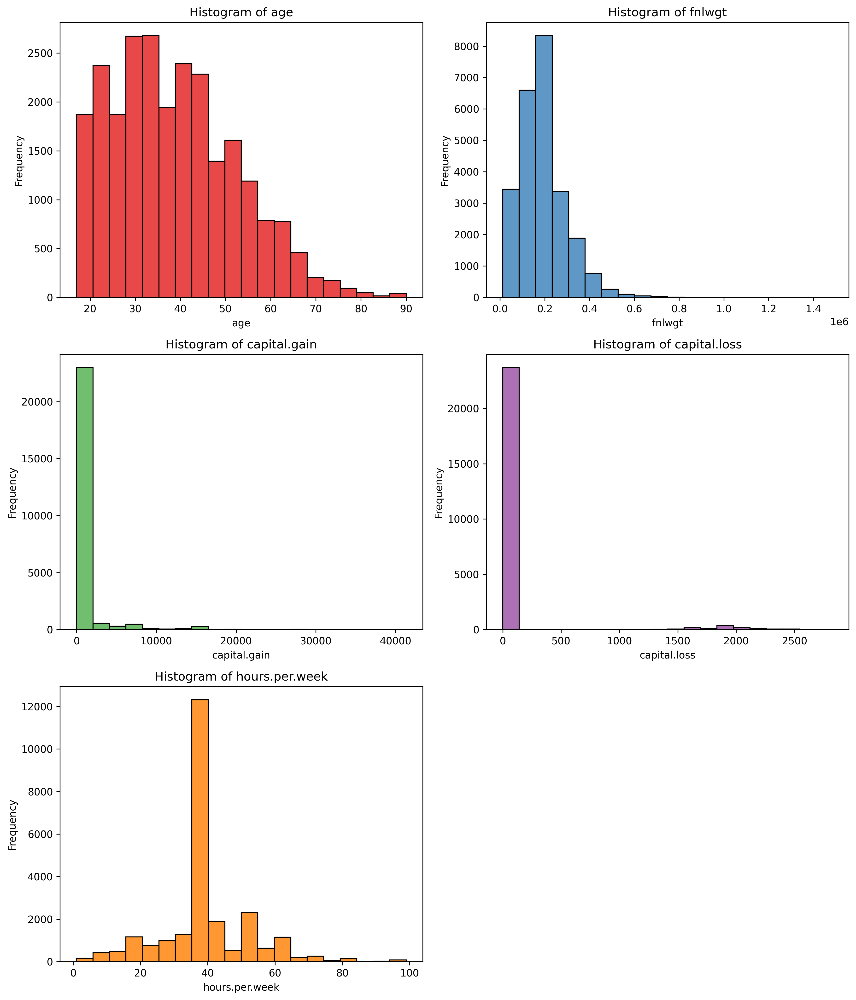

In [37]:
fig,axes = plt.subplots(num_rows,2,figsize=(12,14),dpi=300)

colors = sns.color_palette("Set1",num_columns)
label_color= "black"
title_color = "black"

for i , column in enumerate(columns):
    row = i //2 
    col = i % 2 
    
    
    sns.histplot(data=data[column],ax=axes[row,col],color=colors[i],alpha=0.8,bins=20)
    
    axes[row,col].set_ylabel("Frequency",color=label_color)
    axes[row,col].yaxis.label.set_color(label_color)
    axes[row,col].set_title(f"Histogram of {column}",color=title_color)
    axes[row, col].tick_params(axis='x', colors=label_color)
    axes[row, col].tick_params(axis='y', colors=label_color)
    axes[row, col].title.set_color(title_color)
    fig.subplots_adjust(wspace=0.4)
    
if num_columns % 2 != 0:
    axes[-1, -1].axis('off')
    
plt.tight_layout()
plt.show()
    

      Scatter plot for numerical values


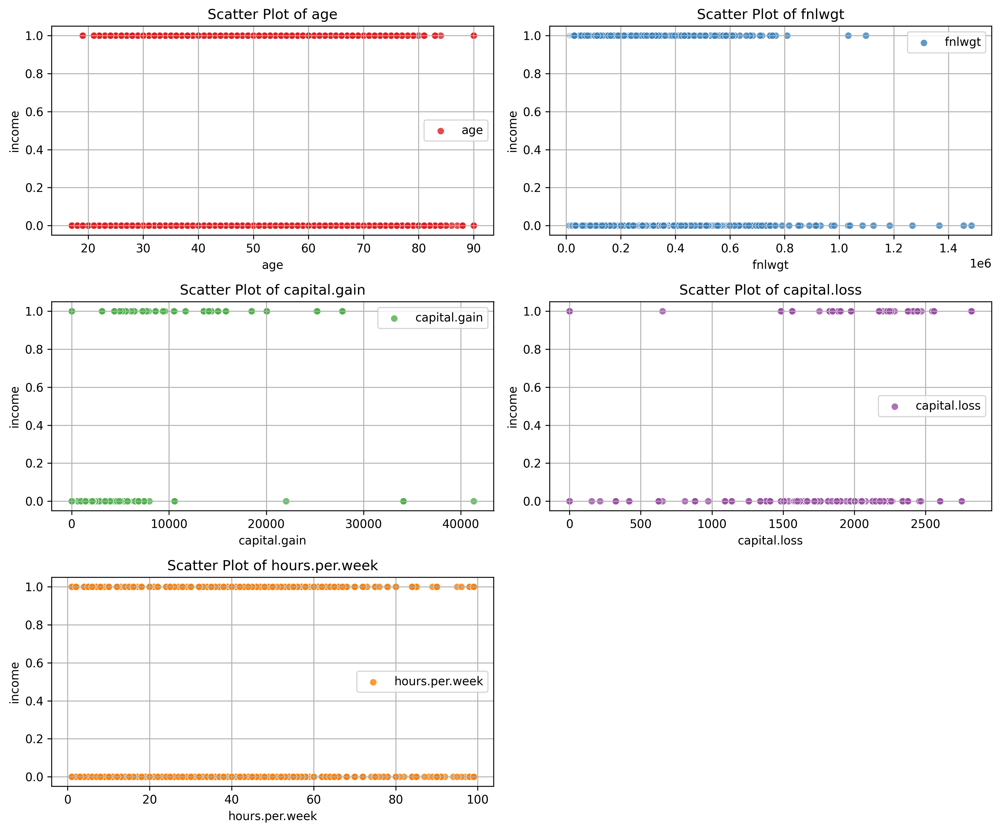

In [39]:
fig, axes = plt.subplots(num_rows, 2, figsize=(12, 10), dpi=300)

colors = sns.color_palette("Set1", num_columns)
label_color = 'black'
title_color = 'black'

for i, column in enumerate(columns):
    row = i // 2
    col = i % 2
    
    sns.scatterplot(data=data, x=column, y='income', ax=axes[row, col], color=colors[i], alpha=0.8, label=column)
    axes[row, col].set_ylabel('income', color=label_color)
    axes[row, col].yaxis.label.set_color(label_color)
    axes[row, col].set_title(f'Scatter Plot of {column}', color=title_color)

    axes[row, col].tick_params(axis='x', colors=label_color)
    axes[row, col].tick_params(axis='y', colors=label_color)
    axes[row, col].title.set_color(title_color)
    axes[row, col].grid(True)
    
    fig.subplots_adjust(wspace=0.4)
    
if num_columns % 2 != 0:
    axes[-1, -1].axis('off')

plt.tight_layout()
plt.show()

      Correlation Heatmap


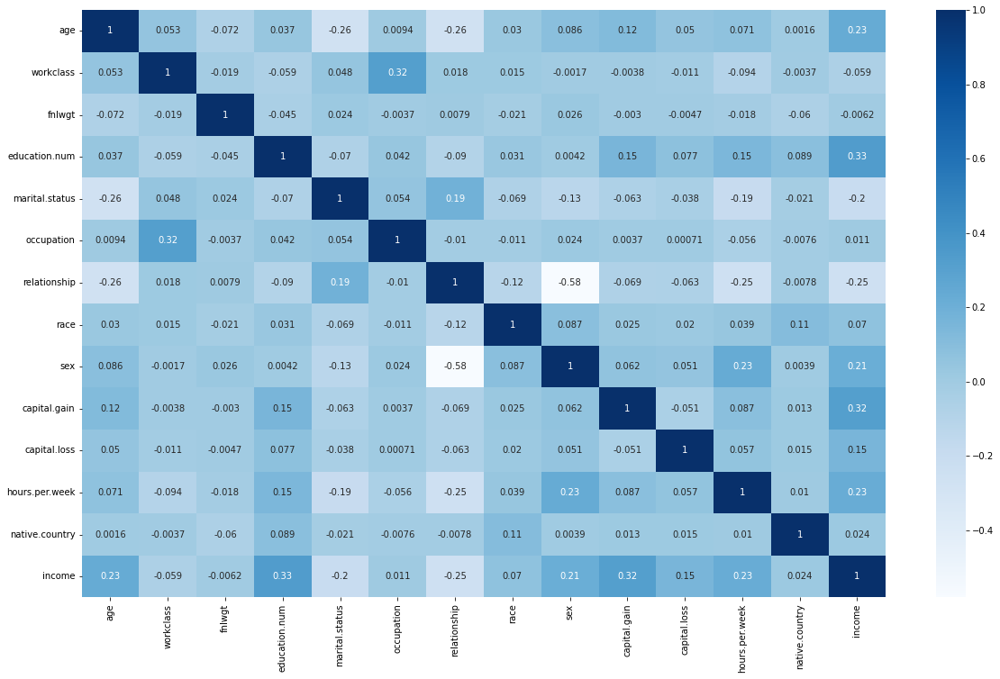

In [40]:
data_corr = data.corr()

plt.figure(figsize=(20,12))
sns.heatmap(data_corr,annot=True,cmap="Blues")
plt.show()

Balancing data


      Seperate dataframe into X and y

In [41]:
x = data.drop("income",axis=1)
y = data["income"]

      Increasing values and making our data balaced


In [45]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)

x_balanced , y_balanced = smote.fit_resample(x,y)

print(y_balanced.value_counts())

0    18937
1    18937
Name: income, dtype: int64


In [48]:
df_balanced = pd.concat([x_balanced,y_balanced],axis=1)

In [49]:
df_balanced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37874 entries, 0 to 37873
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   age             37874 non-null  int64
 1   workclass       37874 non-null  int32
 2   fnlwgt          37874 non-null  int64
 3   education.num   37874 non-null  int64
 4   marital.status  37874 non-null  int32
 5   occupation      37874 non-null  int32
 6   relationship    37874 non-null  int32
 7   race            37874 non-null  int32
 8   sex             37874 non-null  int32
 9   capital.gain    37874 non-null  int64
 10  capital.loss    37874 non-null  int64
 11  hours.per.week  37874 non-null  int64
 12  native.country  37874 non-null  int32
 13  income          37874 non-null  int32
dtypes: int32(8), int64(6)
memory usage: 2.9 MB


      Create balanced X and y and split it for train and test


In [50]:
x_balanced = df_balanced.drop(columns=["income"],axis=1)
y_balanced = df_balanced["income"]

In [52]:
x_train,x_test,y_train,y_test = train_test_split(x_balanced,y_balanced,test_size=0.2,random_state=42)

In [88]:
# Standardize the features
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

Modeling using deep learning ANN

In [92]:
# Build your ANN model
model = keras.Sequential([
    layers.Input(shape=(x_train.shape[1],)),  # Input layer
    layers.Dense(128, activation="relu"),     # Hidden layer with 128 neurons and ReLU activation
    layers.Dense(64, activation="relu"),      # Hidden layer with 64 neurons and ReLU activation
    layers.Dense(1, activation="sigmoid")     # Output layer with 1 neuron and sigmoid activation for binary classification
])

In [95]:
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

In [96]:
history = model.fit(x_train, y_train, epochs=20, batch_size=32, validation_split=0.2)

Epoch 1/20
758/758 [==============================] - 4s 5ms/step - loss: 0.3915 - accuracy: 0.8205 - val_loss: 0.3563 - val_accuracy: 0.8363
Epoch 2/20
758/758 [==============================] - 2s 3ms/step - loss: 0.3477 - accuracy: 0.8437 - val_loss: 0.3421 - val_accuracy: 0.8409
Epoch 3/20
758/758 [==============================] - 2s 3ms/step - loss: 0.3361 - accuracy: 0.8495 - val_loss: 0.3397 - val_accuracy: 0.8452
Epoch 4/20
758/758 [==============================] - 2s 3ms/step - loss: 0.3290 - accuracy: 0.8511 - val_loss: 0.3338 - val_accuracy: 0.8449
Epoch 5/20
758/758 [==============================] - 2s 3ms/step - loss: 0.3230 - accuracy: 0.8542 - val_loss: 0.3319 - val_accuracy: 0.8454
Epoch 6/20
758/758 [==============================] - 2s 2ms/step - loss: 0.3172 - accuracy: 0.8562 - val_loss: 0.3265 - val_accuracy: 0.8500
Epoch 7/20
758/758 [==============================] - 2s 3ms/step - loss: 0.3143 - accuracy: 0.8595 - val_loss: 0.3340 - val_accuracy: 0.8408
Epoch 

In [97]:
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

237/237 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8465
Test Loss: 0.3455
Test Accuracy: 0.8465
